# ReLU vs. Tanh

The goal of this notebook is to explore the effects of moving from Tanh to ReLU activations in our simple models trained on either the nonlinear Gaussian process (NLGP) or the single-pulse (SP) datasets.
For the NLGP dataset, I will use the same settings as in Alessandro's paper to try to reproduce their results (I won't be able to exactly :( ).

I'll try using both mean-squared (MSE) and cross-entropy loss (CE) to see how that affects learning and receptive field emergence.
I was concerned that the ReLU network trained using MSE might behave strangely because it would have an easier time predicting 0 (for which the preactivation can be any nonpositive number) than 1 (in which case it must output exactly 1). 

I will also vary the model architecture, switching from a fully learnable second layer ("linear"), to one that takes the mean but has a learnable bias term ("learnable_bias"), and in the simplest case, just taking the mean ("0.0", which corresponds to a fixed bias value of 0.0).

Note that I've switched to using labels 0 and 1 instead of $\pm 1$ for the MSE setting.
(Otherwise, the ReLU network would not be able to learn the task.)
Because of this, I've also switched from Tanh to sigmoid activations.

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import torch
from conv_emergence import main as simulate
from conv_emergence import compute_entropy as entropy
from conv_emergence import make_key
from viz_box import position_mean_var, ipr, entropy_sort, mean_sort, var_sort, plot_receptive_fields
from itertools import product

In [2]:
SWEEP = list(product(['sigmoid', 'relu'], ['mse', 'ce'], ['linear', 'mean']))

def simulate_or_load(**kwargs):
    path_key = make_key(**kwargs)
    if path_key + '.npz' in os.listdir('weights/'):
        print('Already simulated')
        data = np.load('weights/' + path_key + '.npz', allow_pickle=True)
        weights_, losses_, accs_, iprs_ = data['weights'], data['losses'], data['accs'], data['iprs']
    else:
        print('Simulating')
        weights_, (losses_, accs_, iprs_) = simulate(**kwargs)
    return weights_, (losses_, accs_, iprs_)

def mini_sweep(task, xi1, xi2, L, K, batch_size, num_epochs, lr, init_scale=1.0, gain=None, save_=True):
    kwargs = dict(task=task, xi1=xi1, xi2=xi2, L=L, K=K, batch_size=batch_size, num_epochs=num_epochs, lr=lr, gain=gain, init_scale=init_scale, save_=save_)
    weights, losses, accs, iprs = [], [], [], []
    for activation, loss, second_layer in SWEEP:
        kwargs['activation'] = activation
        kwargs['loss'] = loss
        kwargs['second_layer'] = second_layer
        if isinstance(lr, dict):
            kwargs['lr'] = lr[second_layer]
        weights_, (losses_, accs_, iprs_) = simulate_or_load(**kwargs)
        weights.append(weights_)
        losses.append(losses_); accs.append(accs_); iprs.append(iprs_)
    weights = np.array(weights)
    losses, accs, iprs = np.array(losses), np.array(accs), np.array(iprs)
    return weights, (losses, accs, iprs)

def plot_final_receptive_fields(weights_final):
    fig, axs = plt.subplots(2, 4, figsize=(16, 4))
    for i, ax in enumerate(axs.flatten()):
        w = weights_final[i,:,:]
        reordering = np.argsort(ipr(w))
        ax.imshow(w[reordering,:], cmap='gray')
        ax.set_title(" / ".join([str(x) for x in SWEEP[i]]), fontsize=10)
    return fig, axs

def plot_loss_acc(losses, accs, figsize=(16, 4)):
    fig, axs = plt.subplots(2, 4, figsize=figsize)
    for i, ax in enumerate(axs.flatten()):
        ax.plot(losses[i], label="loss", color='orange', alpha=0.5)
        ax_ = ax.twinx()
        ax_.plot(accs[i], label="acc", color='blue', alpha=0.5)
        ax_.set_ylim(0, 1)
        ax.set_title(" / ".join([str(x) for x in SWEEP[i]]), fontsize=10)
        if i == 0:
            ax.legend()
            ax_.legend()
    return fig, axs

def plot_ipr(iprs, figsize=(16, 4)):
    fig, axs = plt.subplots(2, 4, figsize=figsize)
    for i, ax in enumerate(axs.flatten()):
        ax.plot(iprs[i], label="loss")
        ax.set_title(" / ".join([str(x) for x in SWEEP[i]]), fontsize=10)
    return fig, axs

def viz_mini_sweep(weights, losses, accs, iprs):
    fig1, axs1 = plot_final_receptive_fields(weights[:,-1,:,:])
    fig2, axs2 = plot_loss_acc(losses, accs)
    fig3, axs3 = plot_ipr(iprs)
    return (fig1, fig2, fig3), (axs1, axs2, axs3)

def plot_rf_evolution(weights, num_rows=2, num_cols=4, figsize=(15, 5), cmap='gray'):
    # num_rows * num_cols is the number of receptive fields to plot
    fig, axs = plt.subplots(num_rows, num_cols, figsize=figsize, sharex=True, sharey=True)
    cmap_ = plt.get_cmap(cmap)
    color = cmap_(np.linspace(0.2, 0.8, weights.shape[0]))
    for i, ax in enumerate(axs.flatten()):
        for t in range(weights.shape[0]):
            ax.plot(weights[t,i,:], color=color[t], alpha=0.5)
    return fig, axs

### Nonlinear Gaussian Process

First, we'll see how moving from sigmoid (tanh) to ReLU affects receptive fields when trained on the NLGP dataset.

We'll try a few different task settings:
1. $(\xi_1, \xi_2) = (4, 2), g = 2$ and $K = 40, L = 100$, (from Supp. fig. 1 in Alessandro's paper, to see if we get same effect for plastic second layer)
2. $(\xi_1, \xi_2) = (4, 2), g = 0.05$ and $K = 40, L = 100$, (same, but more Gaussian)
3. $(\xi_1, \xi_2) = (2, 8), g = 2$ and $K = 40, L = 100$, (same as first, but easier to discriminate—flipped $\xi_1$ and $\xi_2$ by accident, oops!) and
4. $(\xi_1, \xi_2) = (2, 8), g = 0.05$ and $K = 40, L = 100$ (same as above, but more Gaussian).

While playing around with the model, I'm noticing that adding a learnable bias to _both_ layers is essential for it to learn the task.
I don't recall this being the case for tanh, but I didn't really experiment.
It shouldn't always be necessary 

#### Setting 1: $(\xi_1, \xi_2) = (4, 2), g = 2$

The top row shows sigmoid activations while the bottom row shows ReLU.
The most striking effect I notice is in the setting where we take the mean in the second layer and use MSE loss.
Here, with sigmoid activation, we see clear differentiation into localized and oscillatory receptive fields.
With ReLU activation, we __only see localized receptive fields__.
My initial guess was that this may be related to oscillatory neurons' roles as bias terms, which I observed in my analysis last week.
However, I am including learnable bias terms here (and I previously only analyzed the pulse dataset), so I don't believe that holds here.

I'm not sure what's going on with ReLU / CE / mean—I may have just gotten the learning rate wrong.

It is good that we are seeing differentiation when we have a plastic second layer.
The result is clearest with a sigmoid activation and MSE loss.
It seems that running it with ReLU activation and MSE loss will work too, and that I just need to train it for longer.

Already simulated
Already simulated
Already simulated
Already simulated
Already simulated
Already simulated
Already simulated
Already simulated


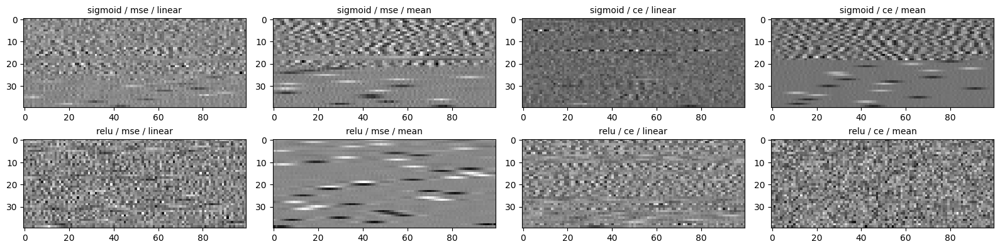

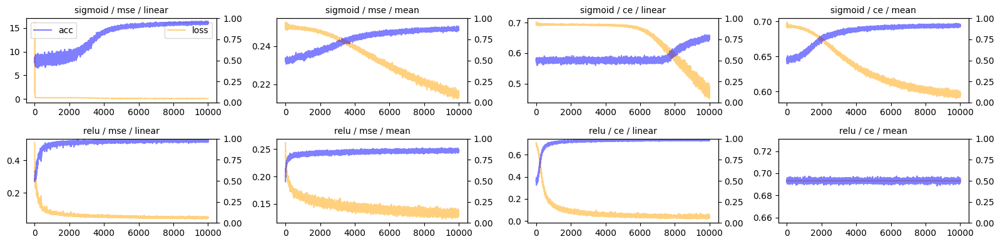

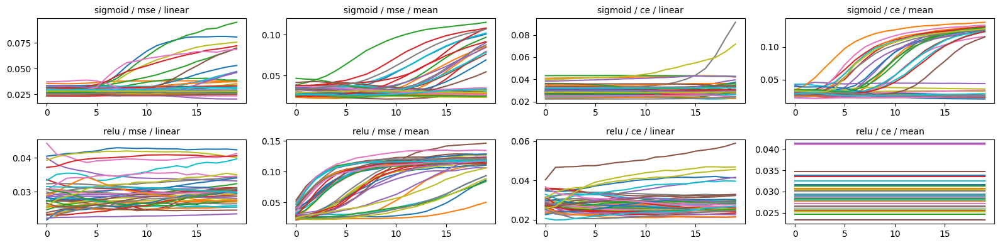

In [51]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 2,
    gain = 2,
    L = 100,
    K = 40,
    batch_size = 1000,
    num_epochs = 10000,
    lr = {'mean' : 1.0, 'linear' : 0.1},
    init_scale = 1.0,
    save_ = True,
)

weights, (losses, accs, iprs) = mini_sweep(**kwargs)
figs, axs = viz_mini_sweep(weights, losses, accs, iprs)
for fig in figs: fig.tight_layout()

##### How does activation affect receptive field evolution?

We'll take the setting of mean model and MSE loss.
First, we'll plot the (unordered images of the receptive fields).
Then, we'll look at the first 8 receptive fields and plot their evolutions over time.
We see that the evolution of localized receptive fields is qualitatively similar between the sigmoid and ReLU neurons.
But, interestingly, we don't see oscillatory neurons.
This is contrast to Alessandro's paper, where they find three types of neurons with (1) high-frequency oscillations, (2) low-frequency oscillations, and (3) localized structure.
However, this was on 2-d input.

Afterward, we'll look at the linear model to see if similar results hold.
We see much less movement in the weights overall.
This may just be due to the lower learning rate I used (because the weight blow up otherwise), since we do begin to see hints of localization.

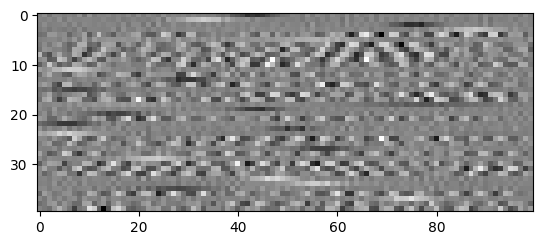

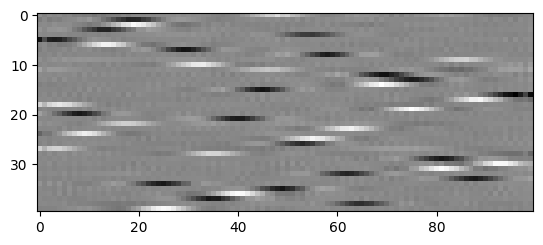

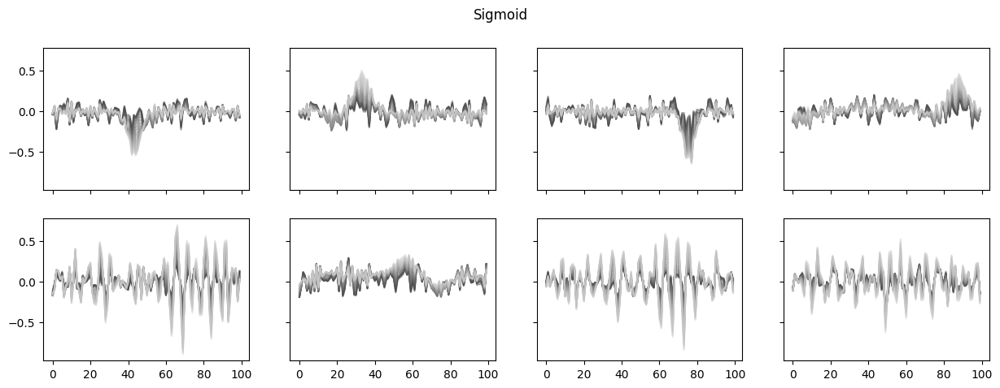

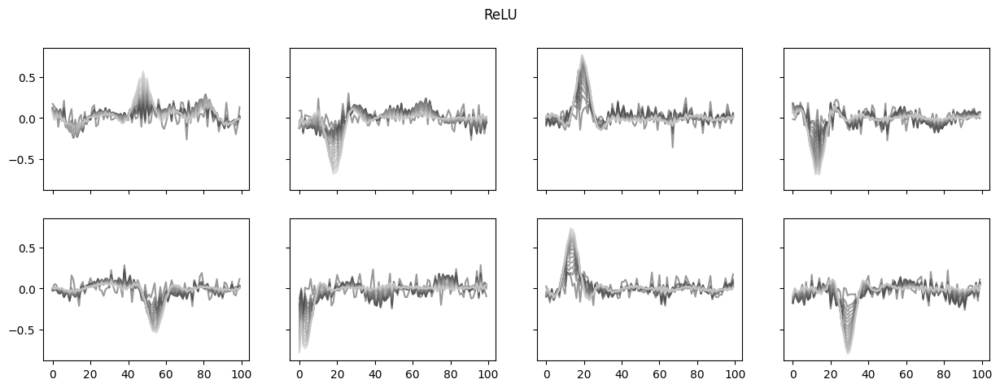

In [54]:
# mean
# sigmoid
plt.imshow(weights[1,-1,:,:], cmap='gray')
plt.show()

# relu
plt.imshow(weights[5,-1,:,:], cmap='gray')
plt.show()

# sigmoid
fig, axs = plot_rf_evolution(weights[1], num_rows=2, num_cols=4, figsize=(15, 5))
fig.suptitle('Sigmoid')

# relu
fig, axs = plot_rf_evolution(weights[5], num_rows=2, num_cols=4, figsize=(15, 5))
_ = fig.suptitle('ReLU')

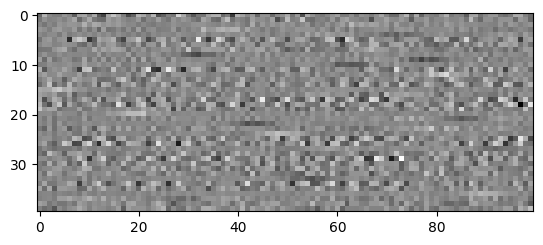

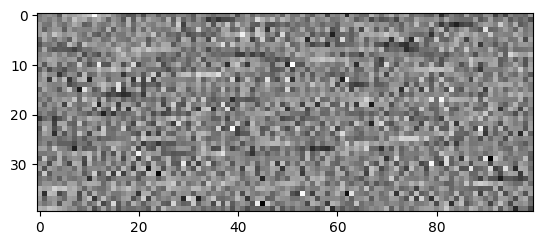

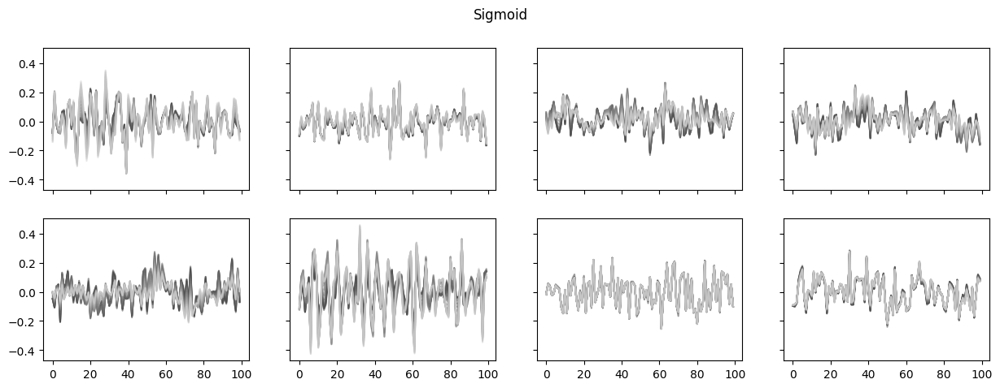

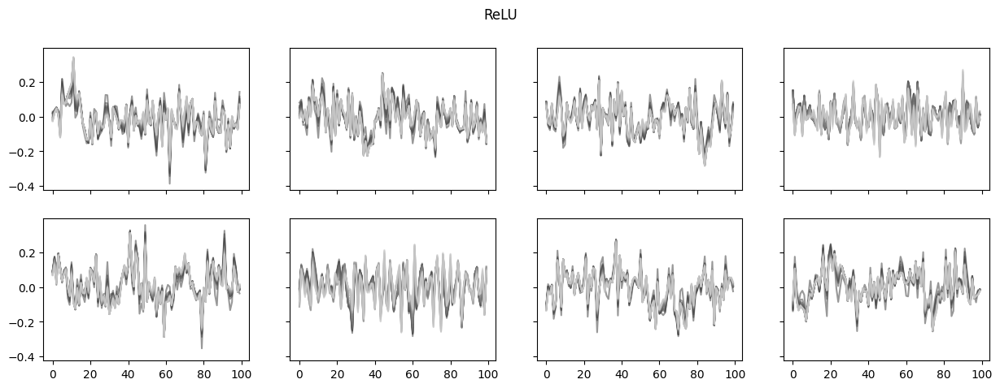

In [55]:
# linear
# sigmoid
plt.imshow(weights[0,-1,:,:], cmap='gray')
plt.show()

# relu
plt.imshow(weights[4,-1,:,:], cmap='gray')
plt.show()

# sigmoid
fig, axs = plot_rf_evolution(weights[0], num_rows=2, num_cols=4, figsize=(15, 5))
fig.suptitle('Sigmoid')

# relu
fig, axs = plot_rf_evolution(weights[4], num_rows=2, num_cols=4, figsize=(15, 5))
_ = fig.suptitle('ReLU')

#### Setting 2: $(\xi_1, \xi_2) = (4, 2), g = 0.05$

The top row shows sigmoid activations while the bottom row shows ReLU.

Already simulated
Already simulated
Already simulated
Already simulated
Already simulated
Already simulated
Already simulated
Already simulated


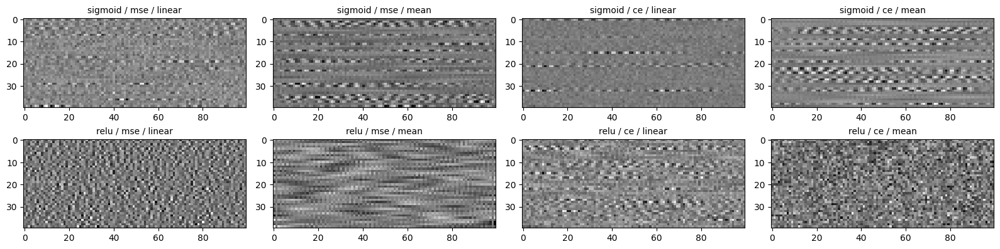

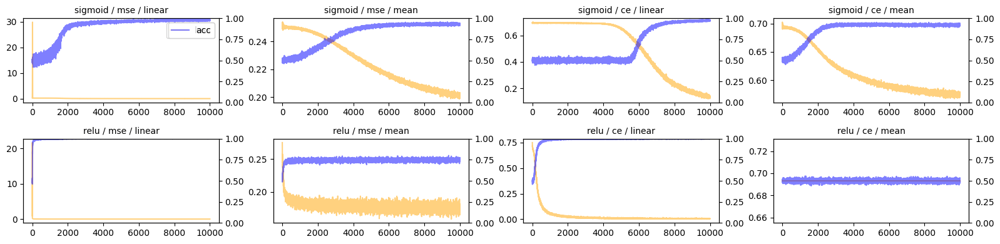

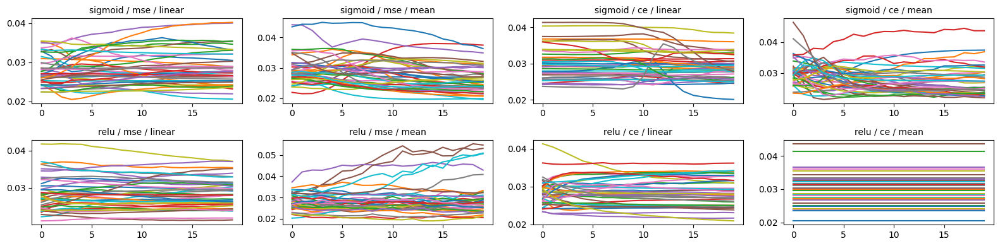

In [56]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 2,
    gain = 0.05,
    L = 100,
    K = 40,
    batch_size = 1000,
    num_epochs = 10000,
    lr = {'mean' : 1.0, 'linear' : 0.1},
    init_scale = 1.0,
    save_ = True,
)

weights, (losses, accs, iprs) = mini_sweep(**kwargs)
figs, axs = viz_mini_sweep(weights, losses, accs, iprs)
for fig in figs: fig.tight_layout()

##### How does activation affect receptive field evolution?

We'll take the setting of mean model and MSE loss.
We'll look at the first 8 receptive fields and plot their evolutions over time.

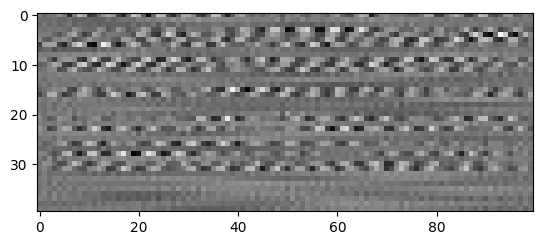

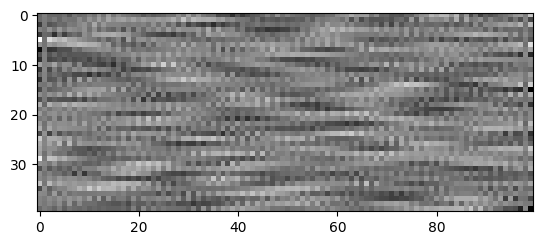

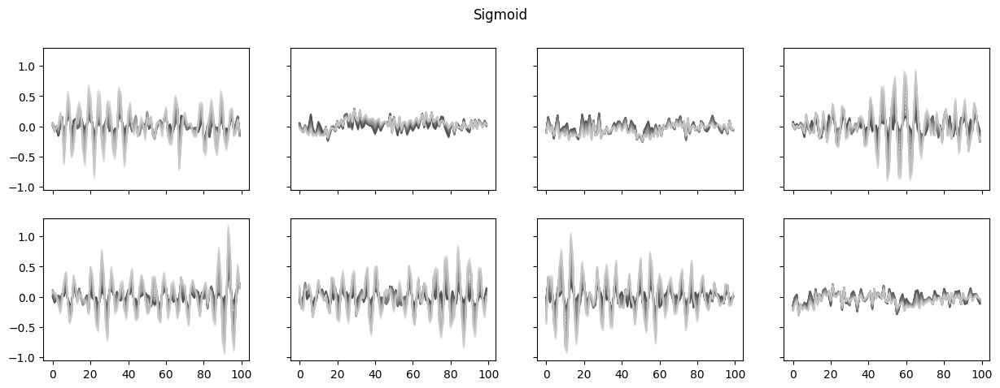

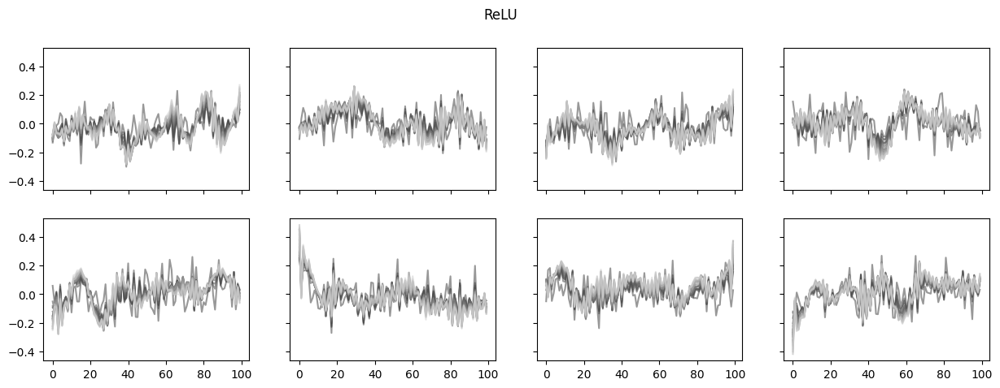

In [57]:
# mean
# sigmoid
plt.imshow(weights[1,-1,:,:], cmap='gray')
plt.show()

# relu
plt.imshow(weights[5,-1,:,:], cmap='gray')
plt.show()

# sigmoid
fig, axs = plot_rf_evolution(weights[1], num_rows=2, num_cols=4, figsize=(15, 5))
fig.suptitle('Sigmoid')

# relu
fig, axs = plot_rf_evolution(weights[5], num_rows=2, num_cols=4, figsize=(15, 5))
_ = fig.suptitle('ReLU')

#### Setting 3: $(\xi_1, \xi_2) = (2, 8), g = 2$

The top row shows sigmoid activations while the bottom row shows ReLU.

Similar results as beforehand.
However, using ReLU activation for the mean architecture & MSE loss learns **only oscillatory receptive fields**, as opposed to only localized weights.
I do not know why.
This contradicts my expectation, since I would have expected that with a larger gap in correlation lengths, 
Indeed, for sigmoid activation, we see that the localized RFs learned are wider than in the first setting.

We see a bit of localization happening when we have a plastic second layer, but, again, it seems like these models were not trained for long enough.

Simulating
Arguments:
task: nlgp
xi1: 2
xi2: 8
L: 100
K: 40
gain: 2
dim: 1
batch_size: 1000
num_epochs: 10000
loss: mse
lr: 0.1
activation: sigmoid
second_layer: linear
init_scale: 1.0
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 500: loss=0.5345, acc=0.5407, IPR=0.0300 (0.0067)
Iteration 1000: loss=0.2154, acc=0.7208, IPR=0.0299 (0.0067)
Iteration 1500: loss=0.1161, acc=0.9170, IPR=0.0301 (0.0068)
Iteration 2000: loss=0.0661, acc=0.9593, IPR=0.0304 (0.0072)
Iteration 2500: loss=0.0547, acc=0.9715, IPR=0.0306 (0.0075)
Iteration 3000: loss=0.0489, acc=0.9772, IPR=0.0306 (0.0075)
Iteration 3500: loss=0.0447, acc=0.9811, IPR=0.0307 (0.0075)
Iteration 4000: loss=0.0421, acc=0.9829, IPR=0.0308 (0.0075)
Iteration 4500: loss=0.0399, acc=0.9854, IPR=0.0308 (0.0074)
Iteration 5000: loss=0.0380, acc=0.9870, IPR=0.0309 (0.0074)
Iteration 5500: loss=0.0366, acc=0.9881, IPR=0.0310 (0.0073)
Iteration 6000: loss=0.0354, acc=0.9891, IPR=0.0310 (0.0072)
Iteration 6500: loss=0.0345, acc=0.9898, IPR

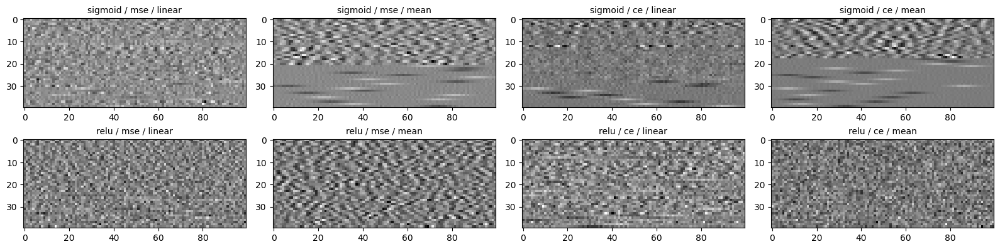

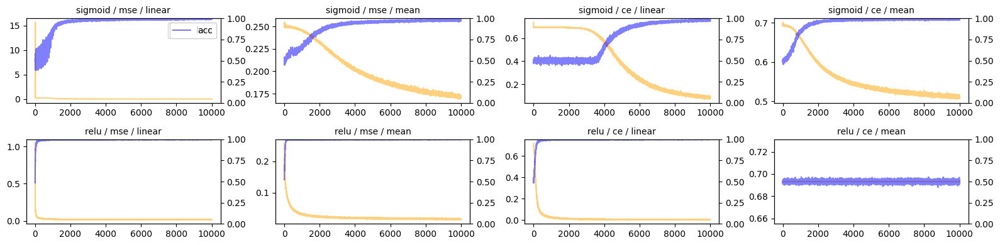

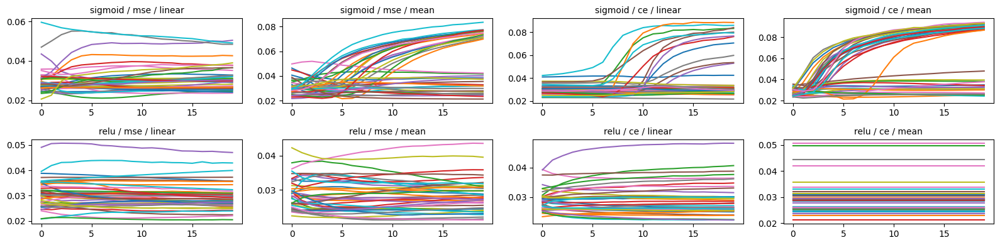

In [59]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 8,
    gain = 2,
    L = 100,
    K = 40,
    batch_size = 1000,
    num_epochs = 10000,
    lr = {'mean' : 1.0, 'linear' : 0.1},
    init_scale = 1.0,
    save_ = True,
)

weights, (losses, accs, iprs) = mini_sweep(**kwargs)
figs, axs = viz_mini_sweep(weights, losses, accs, iprs)
for fig in figs: fig.tight_layout()

##### How does activation affect receptive field evolution?

We'll take the setting of mean model and MSE loss.
We'll look at the first 8 receptive fields and plot their evolutions over time.

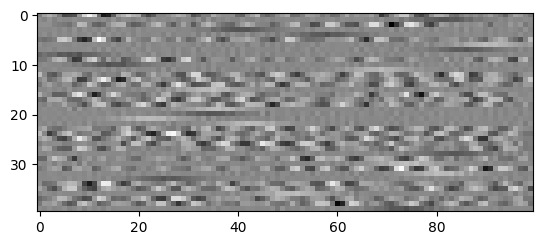

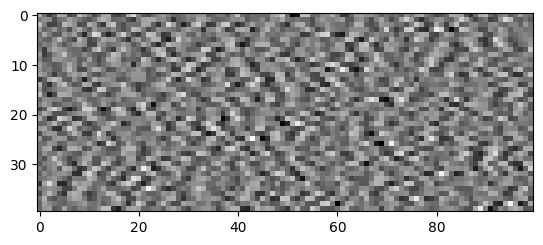

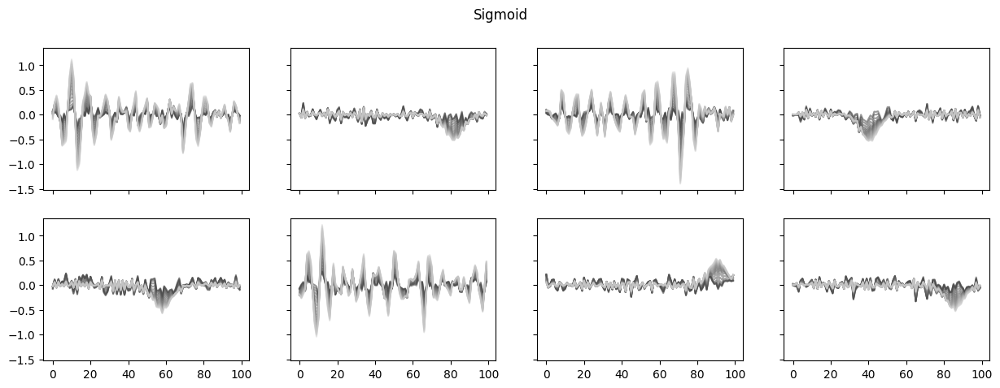

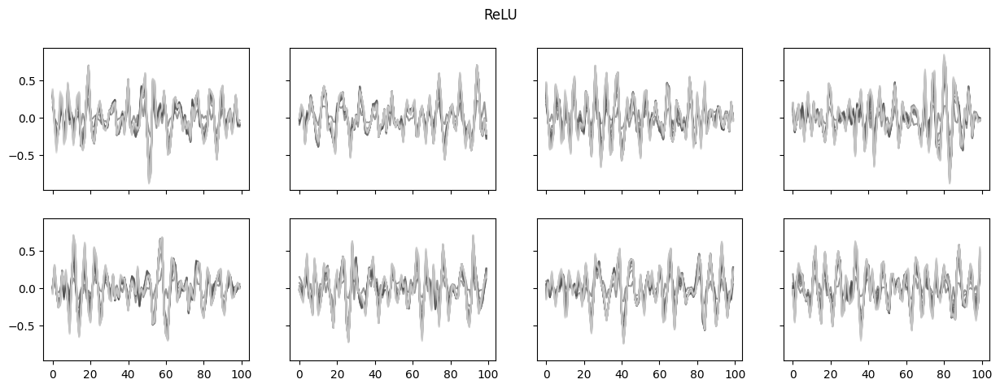

In [61]:
# mean
# sigmoid
plt.imshow(weights[1,-1,:,:], cmap='gray')
plt.show()

# relu
plt.imshow(weights[5,-1,:,:], cmap='gray')
plt.show()

# sigmoid
fig, axs = plot_rf_evolution(weights[1], num_rows=2, num_cols=4, figsize=(15, 5))
fig.suptitle('Sigmoid')

# relu
fig, axs = plot_rf_evolution(weights[5], num_rows=2, num_cols=4, figsize=(15, 5))
_ = fig.suptitle('ReLU')

#### Setting 4: $(\xi_1, \xi_2) = (2, 8), g = 0.05$

The top row shows sigmoid activations while the bottom row shows ReLU.

Similar results as before.
The ReLU model learns _only oscillatory weights_.
When there is differentiation, the second group blurs out.
(It seems like the bandwidth of the kernels is inversely proportional to $g$, or something like that?
Because we do see very tiny bumps that _emerge_.)

Simulating
Arguments:
task: nlgp
xi1: 2
xi2: 8
L: 100
K: 40
gain: 0.05
dim: 1
batch_size: 1000
num_epochs: 10000
loss: mse
lr: 0.1
activation: sigmoid
second_layer: linear
init_scale: 1.0
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 500: loss=0.6210, acc=0.5989, IPR=0.0288 (0.0045)
Iteration 1000: loss=0.1257, acc=0.9125, IPR=0.0284 (0.0043)
Iteration 1500: loss=0.0571, acc=0.9650, IPR=0.0285 (0.0042)
Iteration 2000: loss=0.0480, acc=0.9748, IPR=0.0286 (0.0043)
Iteration 2500: loss=0.0434, acc=0.9799, IPR=0.0287 (0.0042)
Iteration 3000: loss=0.0405, acc=0.9827, IPR=0.0287 (0.0042)
Iteration 3500: loss=0.0384, acc=0.9852, IPR=0.0287 (0.0042)
Iteration 4000: loss=0.0368, acc=0.9867, IPR=0.0286 (0.0041)
Iteration 4500: loss=0.0354, acc=0.9882, IPR=0.0286 (0.0041)
Iteration 5000: loss=0.0343, acc=0.9891, IPR=0.0286 (0.0041)
Iteration 5500: loss=0.0331, acc=0.9901, IPR=0.0286 (0.0040)
Iteration 6000: loss=0.0324, acc=0.9908, IPR=0.0286 (0.0040)
Iteration 6500: loss=0.0315, acc=0.9918, 

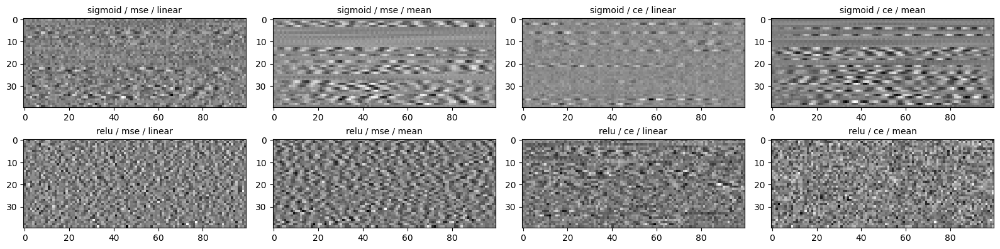

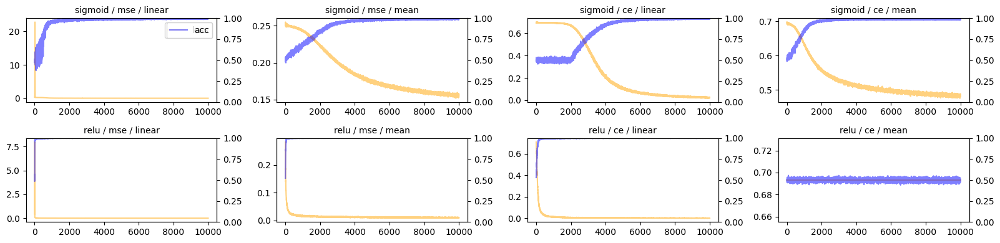

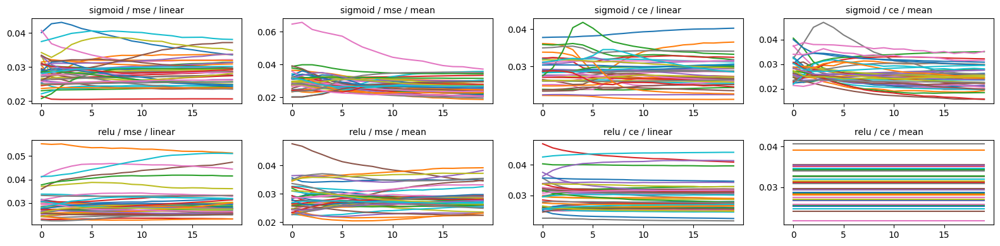

In [64]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 8,
    gain = 0.05,
    L = 100,
    K = 40,
    batch_size = 1000,
    num_epochs = 10000,
    lr = {'mean' : 1.0, 'linear' : 0.1},
    init_scale = 1.0,
    save_ = True,
)

weights, (losses, accs, iprs) = mini_sweep(**kwargs)
figs, axs = viz_mini_sweep(weights, losses, accs, iprs)
for fig in figs: fig.tight_layout()

##### How does activation affect receptive field evolution?

We'll take the setting of mean model and MSE loss.
We'll look at the first 8 receptive fields and plot their evolutions over time.

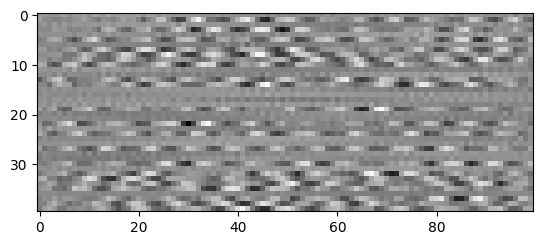

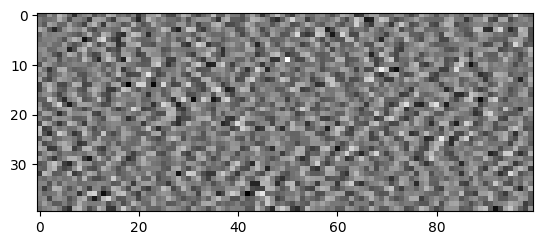

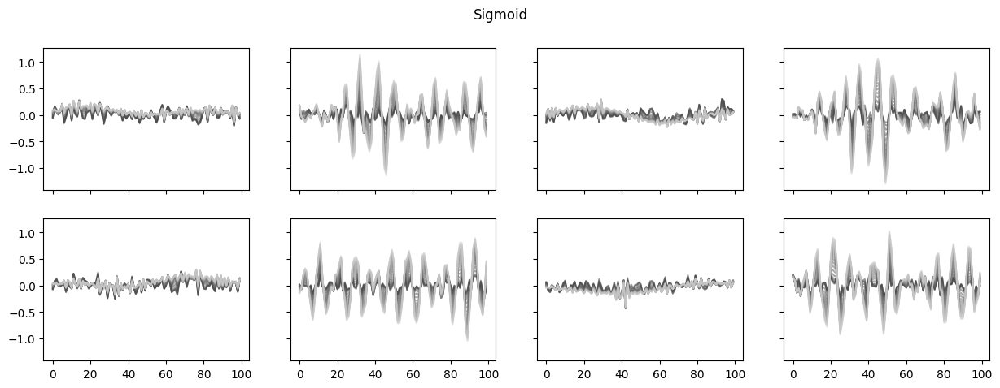

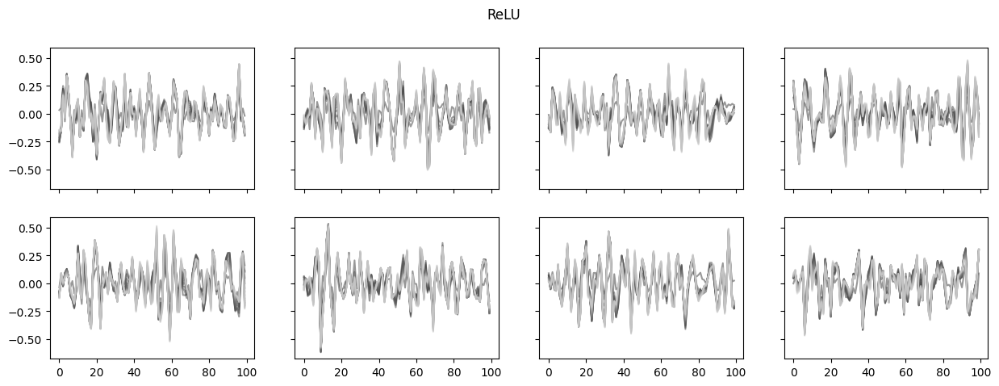

In [65]:
# mean
# sigmoid
plt.imshow(weights[1,-1,:,:], cmap='gray')
plt.show()

# relu
plt.imshow(weights[5,-1,:,:], cmap='gray')
plt.show()

# sigmoid
fig, axs = plot_rf_evolution(weights[1], num_rows=2, num_cols=4, figsize=(15, 5))
fig.suptitle('Sigmoid')

# relu
fig, axs = plot_rf_evolution(weights[5], num_rows=2, num_cols=4, figsize=(15, 5))
_ = fig.suptitle('ReLU')

### Takeaways

If we appropriately adjust the setting and hyperparameters, it seems like we can extend some of our results for sigmoid activation to ReLU activation.
Namely, that we see localized or oscillatory structure emerge.
Importantly, though, we seem to only get either localized _or_ oscillatory receptive fields with ReLU activation.
We have only tried a small number of settings for $(\xi_1, \xi_2)$, so this may not be a consistent finding.
So, a next step is to **try more settings for $(\xi_1, \xi_2)$**.

Also, this is only informed by the performance of ReLU models taking the mean in the second layer trained using MSE.
I believe the asymmetry in how a ReLU model learns 0 vs 1 class labels with MSE is driving this behavior.
I considered CE in addition to MSE to explore this, but I could not get those models to learn when using ReLU and taking the mean in the second layer (I'm not sure why!).
An **immediate next step** is to get **the mean model with ReLU activations to learn using CE**.
We may be able to recover the two phenomenon of two population of neurons in this case.

We should also further explore the models with **ReLU activations and a plastic second layer**.
These models seem to be showing early signs of differentiation between localized and oscillatory neurons, and they also (mostly?) circumvent the issue of asymmetry in class labels because of ReLU activation.

It might also be informative to consider more settings for $(K,L)$, in particular:
1. $K \gg L$ (overparameterization),
2. $K \ll L$ (underparameterization),
3. $K \approx L$ (equiparameterization(?)).

### Fixing mean model with ReLU activation trained with CE

Playing with learning rate and other hyperparameters.

Already simulated


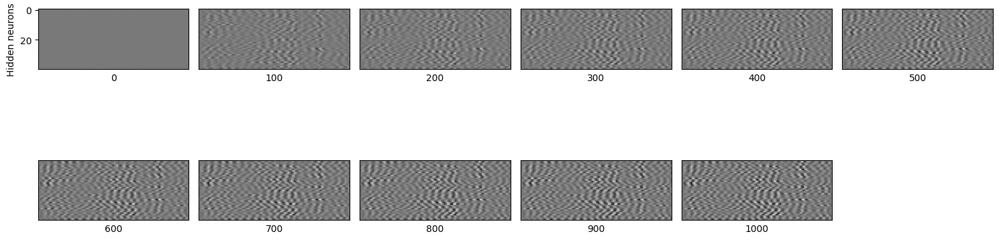

In [96]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 4,
    gain = 0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'ce',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

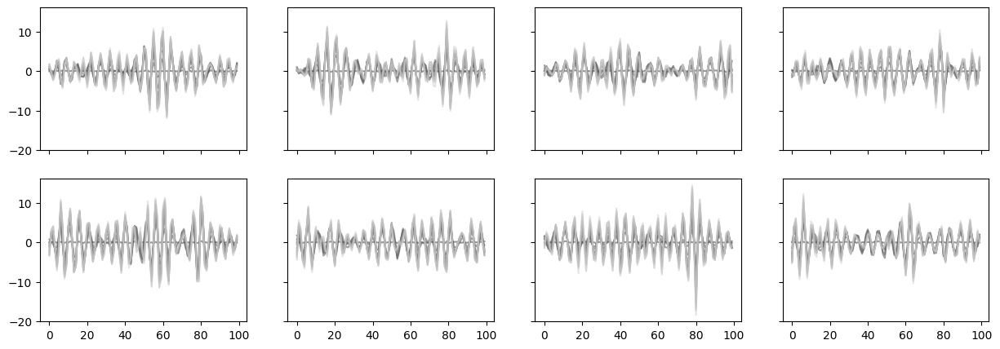

In [97]:
fig, axs = plot_rf_evolution(weights, num_rows=2, num_cols=4, figsize=(15, 5), cmap='gray')

Already simulated


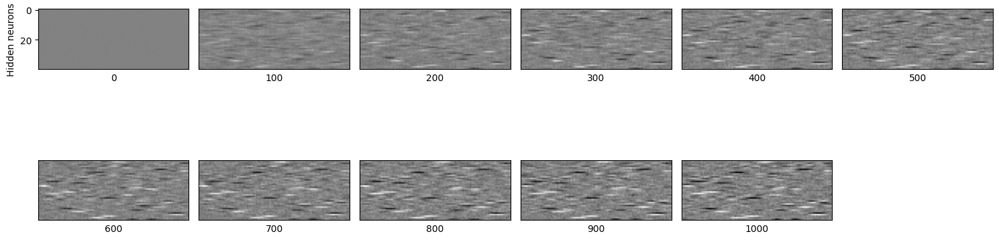

In [100]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 2,
    gain = 10, #0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'ce',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


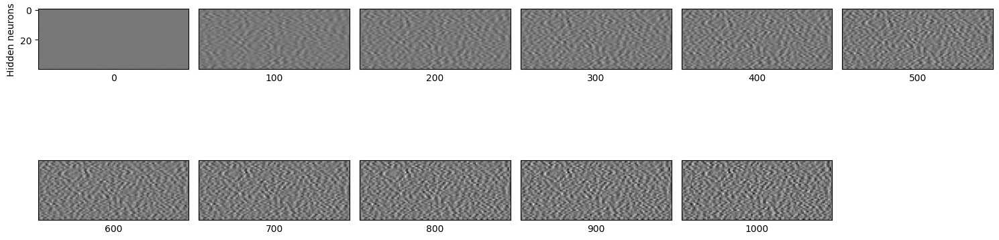

In [101]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 4,
    gain = 10, #0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'ce',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Simulating
Arguments:
task: nlgp
xi1: 4
xi2: 2
L: 100
K: 40
gain: 10
dim: 1
batch_size: 1000
num_epochs: 1000
loss: mse
lr: 1.0
activation: relu
second_layer: mean
init_scale: 1.0
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 100: loss=0.2256, acc=0.6532, IPR=0.0292 (0.0048)
Iteration 200: loss=0.1994, acc=0.7462, IPR=0.0302 (0.0057)
Iteration 300: loss=0.1874, acc=0.7817, IPR=0.0317 (0.0071)
Iteration 400: loss=0.1810, acc=0.7945, IPR=0.0333 (0.0089)
Iteration 500: loss=0.1760, acc=0.8024, IPR=0.0351 (0.0110)
Iteration 600: loss=0.1723, acc=0.8087, IPR=0.0369 (0.0133)
Iteration 700: loss=0.1695, acc=0.8105, IPR=0.0386 (0.0151)
Iteration 800: loss=0.1679, acc=0.8131, IPR=0.0404 (0.0170)
Iteration 900: loss=0.1658, acc=0.8167, IPR=0.0425 (0.0189)
Iteration 1000: loss=0.1640, acc=0.8213, IPR=0.0446 (0.0206)
Saved weights, losses, accs, iprs


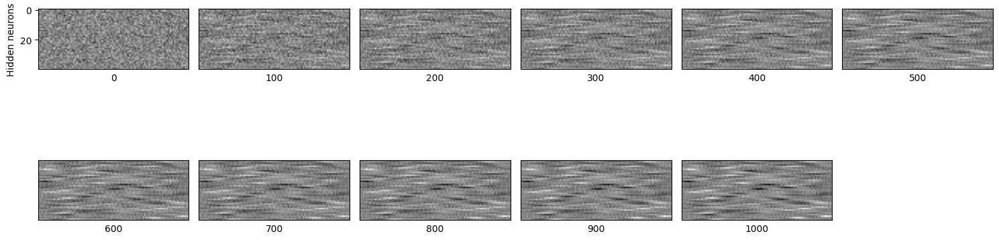

In [103]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 2,
    gain = 10, #0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


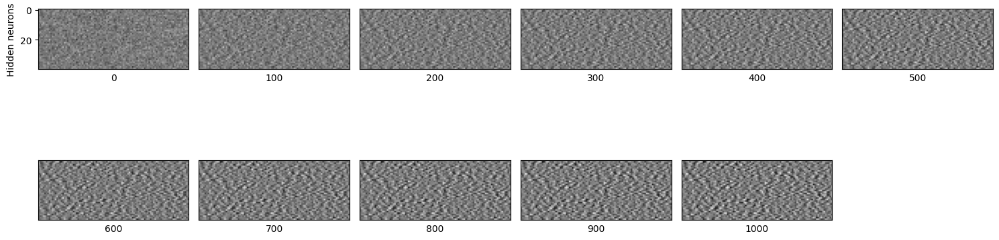

In [163]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 4,
    gain = 10, #0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

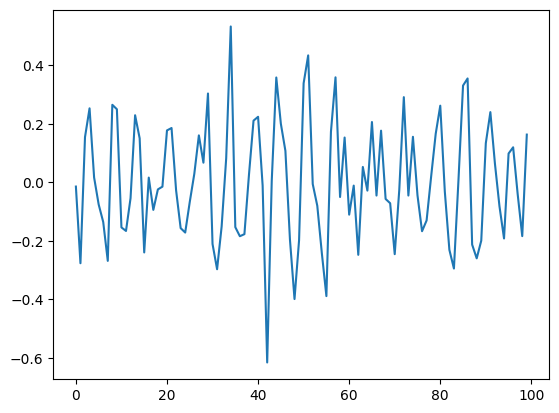

In [165]:
plt.plot(weights[-1,0])

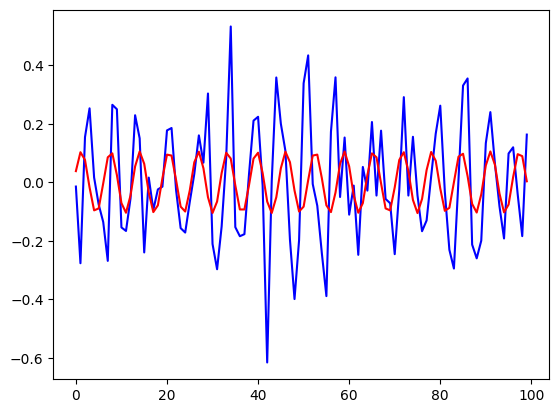

In [171]:
# fit sine curve
from scipy.optimize import curve_fit
def func(x, a, b, c):
    return a * np.sin(b * x + c)
# fit it
popt, pcov = curve_fit(func, np.arange(100), weights[-1,0])
# plot it
plt.plot(np.arange(100), weights[-1,0], 'b-', label='data')
plt.plot(np.arange(100), func(np.arange(100), *popt), 'r-', label='fit')

Simulating
Arguments:
task: nlgp
xi1: 8
xi2: 2
L: 100
K: 40
gain: 10
dim: 1
batch_size: 1000
num_epochs: 1000
loss: mse
lr: 1.0
activation: relu
second_layer: mean
init_scale: 1.0
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 100: loss=0.1698, acc=0.8052, IPR=0.0293 (0.0038)
Iteration 200: loss=0.1251, acc=0.9010, IPR=0.0313 (0.0057)
Iteration 300: loss=0.1105, acc=0.9210, IPR=0.0337 (0.0076)
Iteration 400: loss=0.1025, acc=0.9310, IPR=0.0364 (0.0093)
Iteration 500: loss=0.0971, acc=0.9395, IPR=0.0391 (0.0108)
Iteration 600: loss=0.0931, acc=0.9429, IPR=0.0418 (0.0121)
Iteration 700: loss=0.0899, acc=0.9462, IPR=0.0445 (0.0133)
Iteration 800: loss=0.0871, acc=0.9499, IPR=0.0471 (0.0141)
Iteration 900: loss=0.0845, acc=0.9529, IPR=0.0497 (0.0147)
Iteration 1000: loss=0.0825, acc=0.9546, IPR=0.0521 (0.0153)
Saved weights, losses, accs, iprs


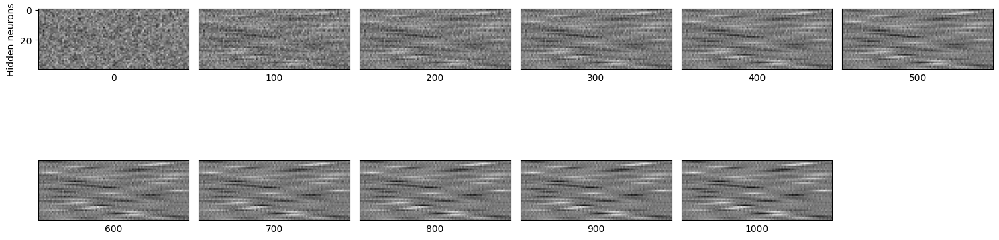

In [126]:
kwargs = dict(
    task='nlgp',
    xi1 = 8,
    xi2 = 2,
    gain = 10, #0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Simulating
Arguments:
task: nlgp
xi1: 8
xi2: 2
L: 100
K: 40
gain: 0.05
dim: 1
batch_size: 1000
num_epochs: 1000
loss: mse
lr: 0.2
activation: relu
second_layer: mean
init_scale: 1.0
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 100: loss=0.2364, acc=0.5711, IPR=0.0288 (0.0040)
Iteration 200: loss=0.1906, acc=0.7074, IPR=0.0289 (0.0040)
Iteration 300: loss=0.1708, acc=0.7761, IPR=0.0290 (0.0041)
Iteration 400: loss=0.1598, acc=0.8068, IPR=0.0291 (0.0042)
Iteration 500: loss=0.1530, acc=0.8212, IPR=0.0291 (0.0043)
Iteration 600: loss=0.1493, acc=0.8293, IPR=0.0291 (0.0044)
Iteration 700: loss=0.1468, acc=0.8324, IPR=0.0291 (0.0045)
Iteration 800: loss=0.1442, acc=0.8359, IPR=0.0292 (0.0046)
Iteration 900: loss=0.1426, acc=0.8398, IPR=0.0291 (0.0046)
Iteration 1000: loss=0.1414, acc=0.8411, IPR=0.0291 (0.0047)
Saved weights, losses, accs, iprs


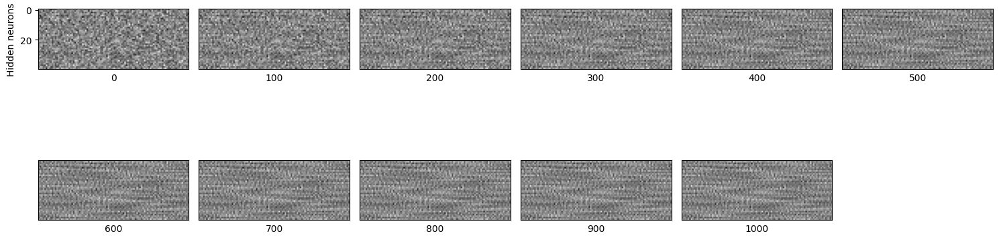

In [156]:
kwargs = dict(
    task='nlgp',
    xi1 = 8,
    xi2 = 2,
    gain = 0.05, #0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2, #1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Simulating
Arguments:
task: nlgp
xi1: 2
xi2: 8
L: 100
K: 40
gain: 10
dim: 1
batch_size: 1000
num_epochs: 1000
loss: mse
lr: 1.0
activation: relu
second_layer: mean
init_scale: 1.0
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 100: loss=0.1928, acc=0.7505, IPR=0.0293 (0.0052)
Iteration 200: loss=0.1383, acc=0.9589, IPR=0.0294 (0.0051)
Iteration 300: loss=0.1199, acc=0.9778, IPR=0.0296 (0.0050)
Iteration 400: loss=0.1070, acc=0.9834, IPR=0.0296 (0.0049)
Iteration 500: loss=0.0976, acc=0.9870, IPR=0.0296 (0.0048)
Iteration 600: loss=0.0903, acc=0.9890, IPR=0.0295 (0.0047)
Iteration 700: loss=0.0842, acc=0.9904, IPR=0.0295 (0.0047)
Iteration 800: loss=0.0795, acc=0.9915, IPR=0.0295 (0.0047)
Iteration 900: loss=0.0752, acc=0.9921, IPR=0.0295 (0.0046)
Iteration 1000: loss=0.0715, acc=0.9924, IPR=0.0295 (0.0046)
Saved weights, losses, accs, iprs


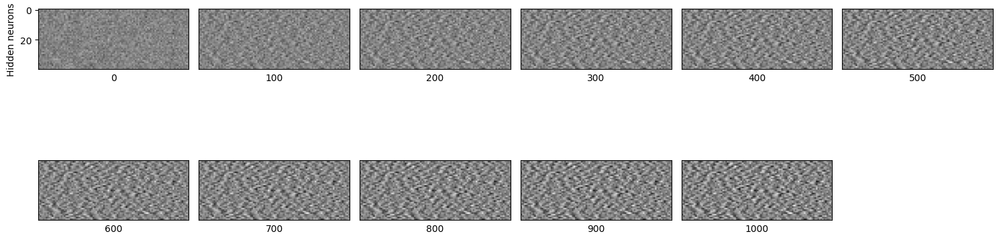

In [124]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 8,
    gain = 10, #0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Simulating
Arguments:
task: nlgp
xi1: 2
xi2: 8
L: 100
K: 40
gain: 0.05
dim: 1
batch_size: 1000
num_epochs: 1000
loss: mse
lr: 1.0
activation: relu
second_layer: mean
init_scale: 1.0
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 100: loss=0.1031, acc=0.9220, IPR=0.0291 (0.0050)
Iteration 200: loss=0.0408, acc=0.9977, IPR=0.0291 (0.0050)
Iteration 300: loss=0.0285, acc=0.9990, IPR=0.0291 (0.0050)
Iteration 400: loss=0.0235, acc=0.9990, IPR=0.0291 (0.0051)
Iteration 500: loss=0.0209, acc=0.9994, IPR=0.0291 (0.0052)
Iteration 600: loss=0.0194, acc=0.9995, IPR=0.0291 (0.0054)
Iteration 700: loss=0.0185, acc=0.9995, IPR=0.0291 (0.0055)
Iteration 800: loss=0.0178, acc=0.9997, IPR=0.0291 (0.0057)
Iteration 900: loss=0.0174, acc=0.9997, IPR=0.0291 (0.0058)
Iteration 1000: loss=0.0166, acc=0.9997, IPR=0.0291 (0.0059)
Saved weights, losses, accs, iprs


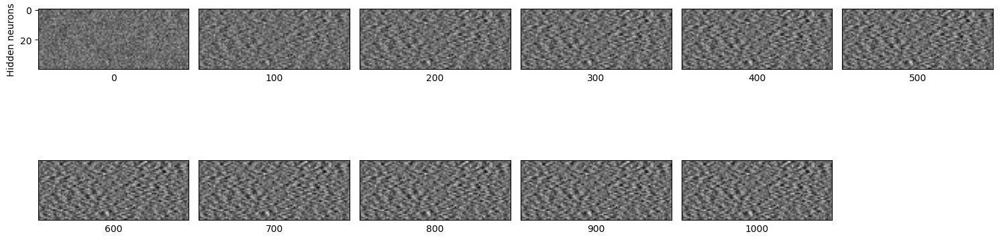

In [125]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 8,
    gain = 0.05, #0.05,
    L = 100, # 100,
    K = 40, # 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Simulating
Arguments:
task: nlgp
xi1: 2
xi2: 4
L: 100
K: 40
gain: 10
dim: 1
batch_size: 1000
num_epochs: 1000
loss: mse
lr: 0.2
activation: relu
second_layer: mean
init_scale: 1.0
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 100: loss=0.2596, acc=0.5220, IPR=0.0293 (0.0035)
Iteration 200: loss=0.2458, acc=0.5682, IPR=0.0293 (0.0036)
Iteration 300: loss=0.2346, acc=0.6144, IPR=0.0293 (0.0038)
Iteration 400: loss=0.2258, acc=0.6571, IPR=0.0294 (0.0042)
Iteration 500: loss=0.2172, acc=0.7056, IPR=0.0295 (0.0044)
Iteration 600: loss=0.2107, acc=0.7431, IPR=0.0295 (0.0048)
Iteration 700: loss=0.2051, acc=0.7728, IPR=0.0296 (0.0050)
Iteration 800: loss=0.2003, acc=0.7963, IPR=0.0297 (0.0053)
Iteration 900: loss=0.1964, acc=0.8160, IPR=0.0297 (0.0055)
Iteration 1000: loss=0.1930, acc=0.8289, IPR=0.0298 (0.0056)
Saved weights, losses, accs, iprs


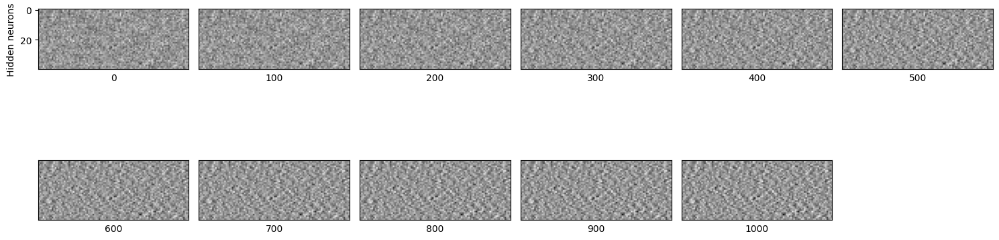

In [155]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 4,
    gain = 10, #0.05,
    L = 100,
    K = 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2, #1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

#### Quick summary

It seems like the role of oscillatory neurons is to bias the output up (down?), and the role of localized weights is to bias the output down (up?).
In tanh, biasing must be done in both directions, so we need both.
However, in ReLU, biasing is only done in one direction, so we only need one.
If the short-scale class has label 0, then oscillatory RFs are learned so that the output is biased below 0, so the ReLU makes it 0.
Conversely, if the long-scale class has label 0, then long-frequency (not localized?!) RFs are learned so that the output is biased down.

##### Questions:
- Why do we get localized RFs sometimes, while other times we get very long-range oscillations? It does not seem like ReLU allows us to understan this distinction.

My takeaways:
- relu: short (long) range oscillations bias output down if short (long) class has label 0; localization appear less common, but see it with very large gain and xi1 > xi2.
- tanh: do the insights from above hold?

**immediate to-do**: quickly replicate Alessandro's result for 2-d inputs

**subsequent to-do**: then move over to Jax to get a sweep over (xi1,xi2,g) going for tanh/relu using mse.

**then**: go home bruv

In [128]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 1,
    gain = 3, #0.05,
    L = 20,
    dim = 2,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)

Already simulated


In [130]:
weights_ = weights[-1].reshape(-1, kwargs['L'], kwargs['L'])

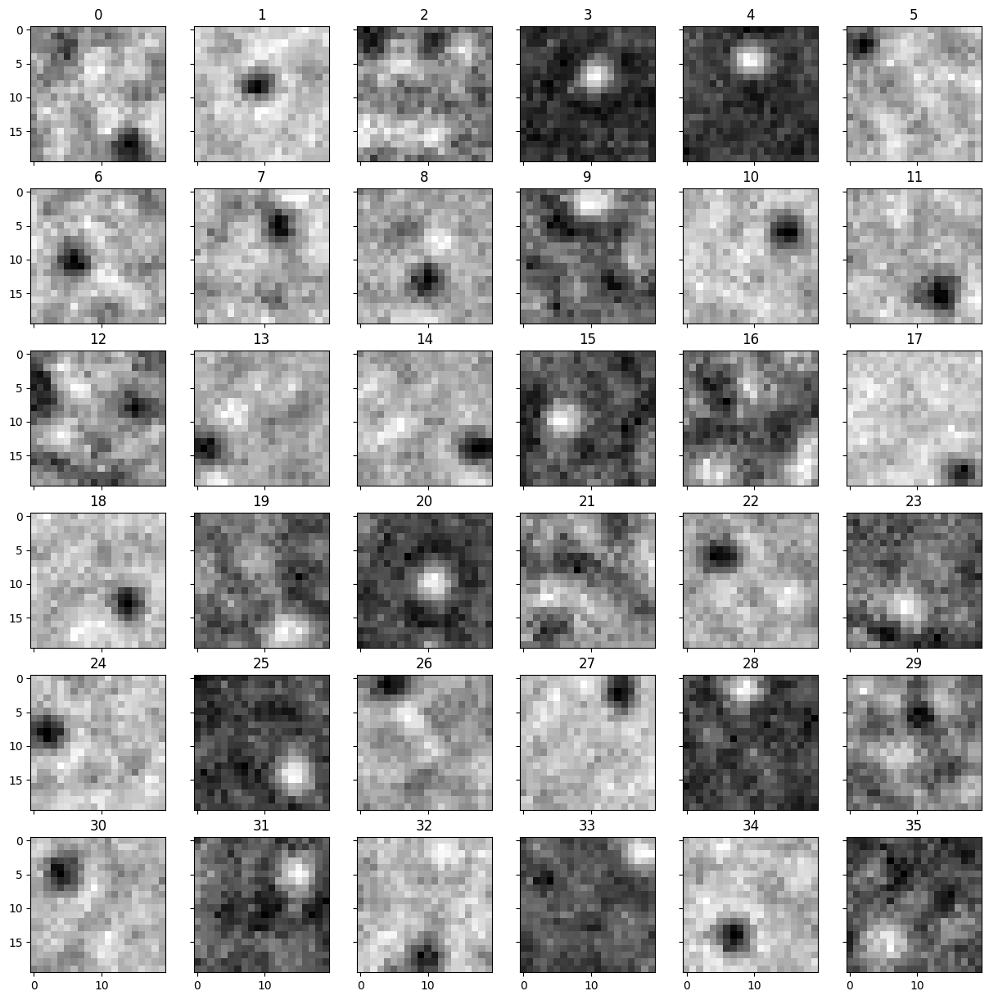

In [135]:
fig, axs = plt.subplots(6, 6, figsize=(15, 15), sharex=True, sharey=True)
for i, ax in enumerate(axs.flatten()):
    ax.imshow(weights_[i,:,:], cmap='gray')
    ax.set_title(i)

Already simulated


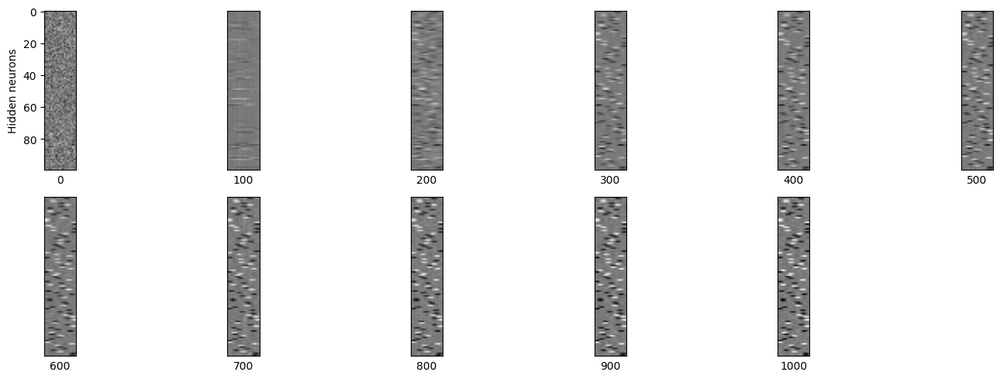

In [137]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 1,
    gain = 3, #0.05,
    L = 20,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


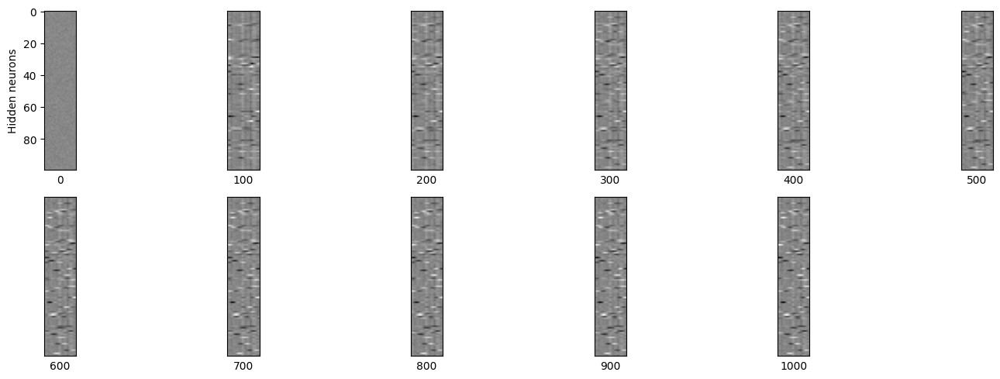

In [138]:
kwargs = dict(
    task='nlgp',
    xi1 = 2,
    xi2 = 1,
    gain = 3, #0.05,
    L = 20,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


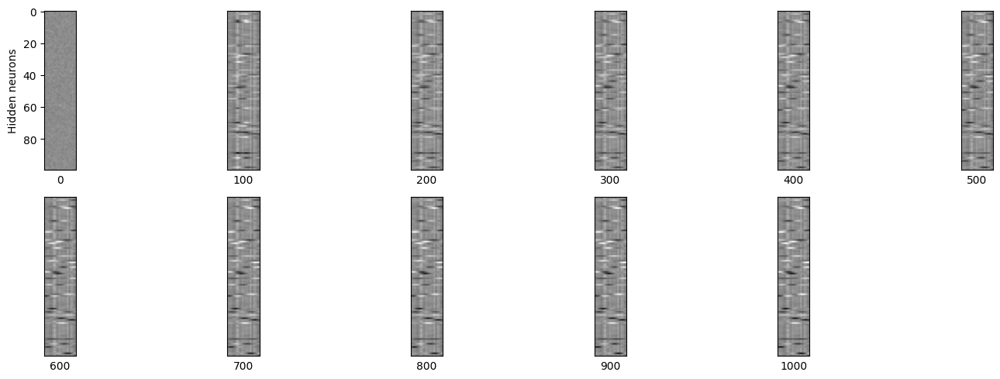

In [7]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 1,
    gain = 3, #0.05,
    L = 20,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

[ 0.32843939 11.51481663  3.44405299]


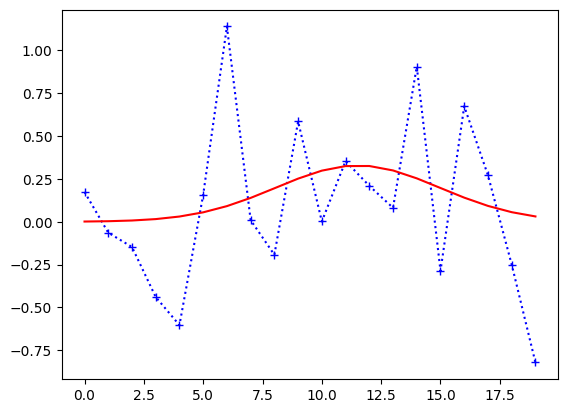

In [15]:
from scipy.optimize import curve_fit
rf = weights[-1,9]
gauss = lambda x, a, x0, sigma: a*np.exp(-(x-x0)**2/(2*sigma**2))
x = np.arange(0, 20)
popt, pcov = curve_fit(gauss, x, rf, p0=[1, 10, 1])
print(popt)
# plot fit
plt.plot(x, rf, 'b+:', label='data')
plt.plot(x, gauss(x, *popt), 'r-', label='fit')

Already simulated


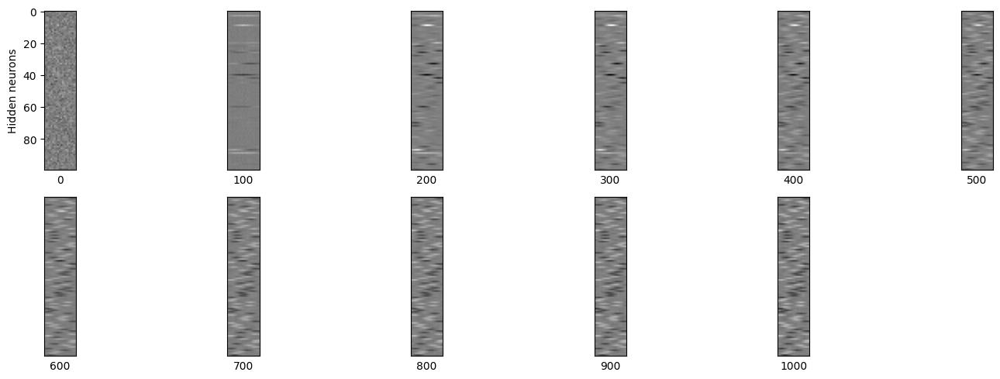

In [157]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 1,
    gain = 3, #0.05,
    L = 20,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

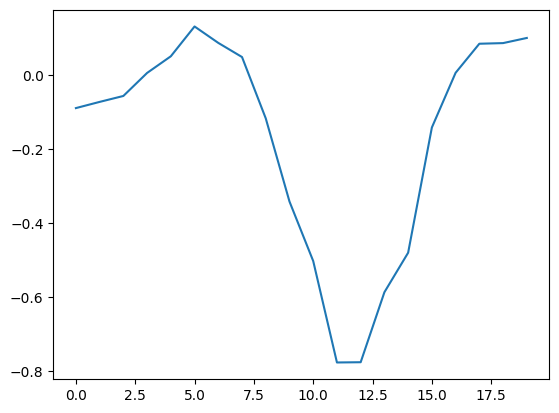

In [160]:
rf = weights[-1,0]
plt.plot(rf)

In [161]:
from scipy.optimize import curve_fit
gauss = lambda x, a, x0, sigma: a*np.exp(-(x-x0)**2/(2*sigma**2))
x = np.arange(0, 20)
popt, pcov = curve_fit(gauss, x, rf, p0=[1, 10, 1])
print(popt)
# plot fit
plt.plot(x, rf, 'b+:', label='data')
plt.plot(x, gauss(x, *popt), 'r-', label='fit')

array([-0.80764182, 11.69339268,  1.86146863])

Already simulated


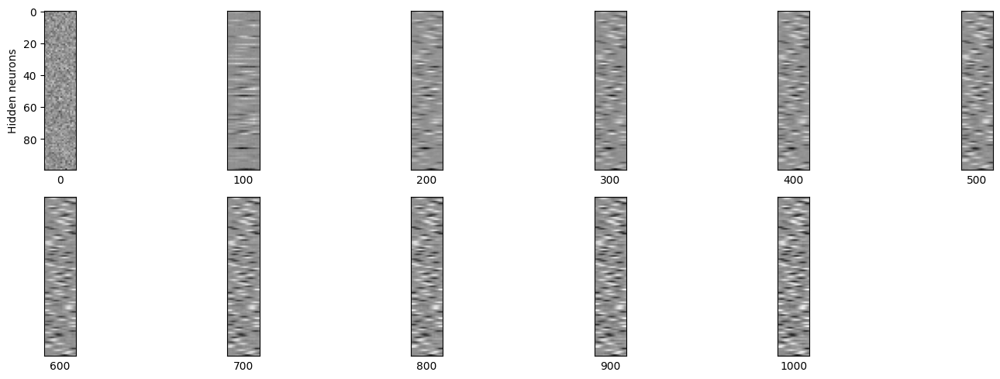

In [142]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 0.1,
    gain = 3, #0.05,
    L = 20,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


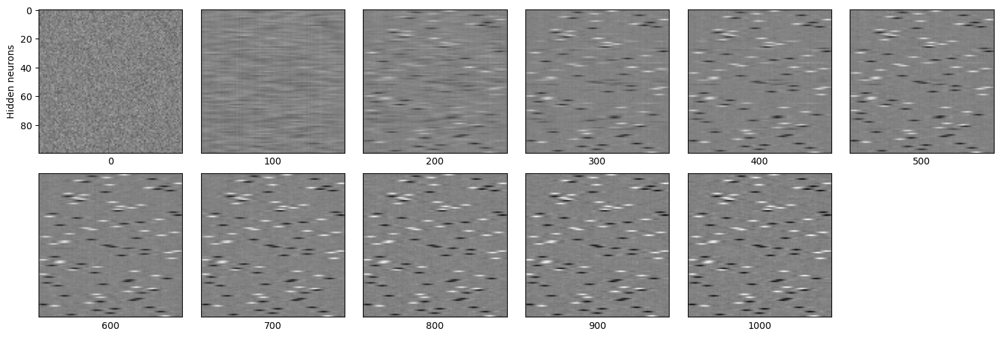

In [143]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 0.1,
    gain = 3, #0.05,
    L = 100,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


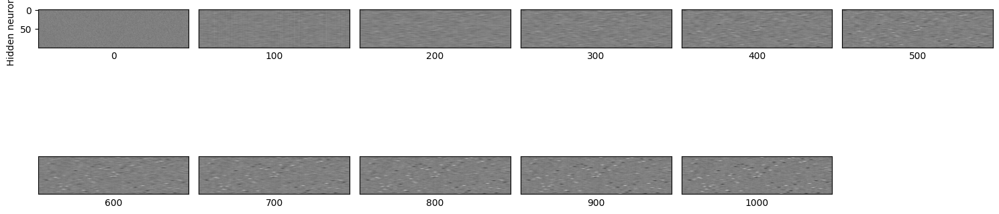

In [145]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 0.1,
    gain = 3, #0.05,
    L = 400,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


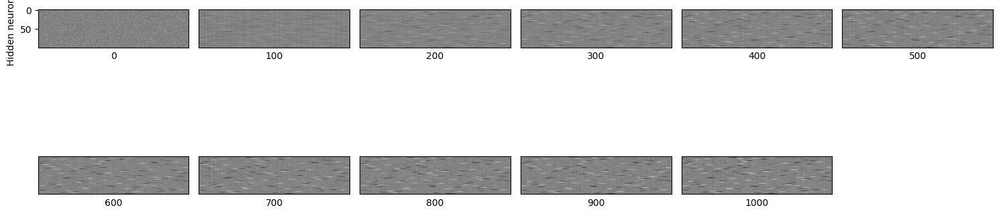

In [146]:
kwargs = dict(
    task='nlgp',
    xi1 = 8,
    xi2 = 2,
    gain = 3, #0.05,
    L = 400,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


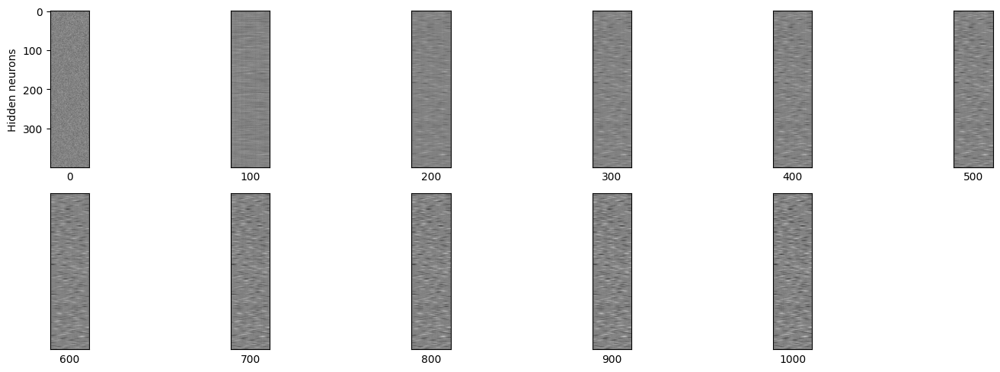

In [148]:
kwargs = dict(
    task='nlgp',
    xi1 = 8,
    xi2 = 2,
    gain = 3, #0.05,
    L = 100,
    dim = 1,
    K = 400,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


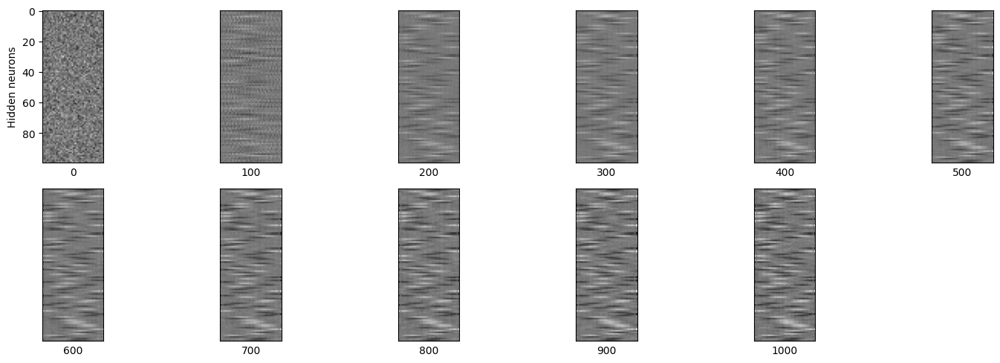

In [152]:
kwargs = dict(
    task='nlgp',
    xi1 = 8,
    xi2 = 2,
    gain = 3, #0.05,
    L = 40,
    dim = 1,
    K = 100,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


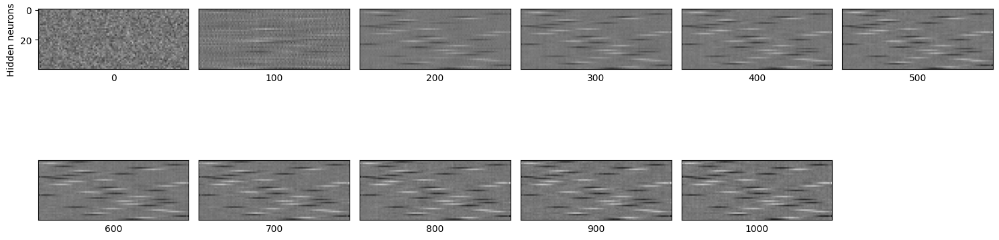

In [153]:
kwargs = dict(
    task='nlgp',
    xi1 = 8,
    xi2 = 2,
    gain = 3, #0.05,
    L = 100,
    dim = 1,
    K = 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


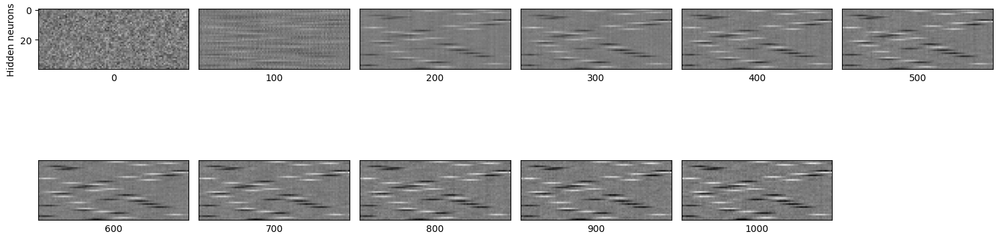

In [154]:
kwargs = dict(
    task='nlgp',
    xi1 = 8,
    xi2 = 2,
    gain = 10, #0.05,
    L = 100,
    dim = 1,
    K = 40,
    batch_size = 1000,
    num_epochs = 1000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'mse',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights[::10], num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


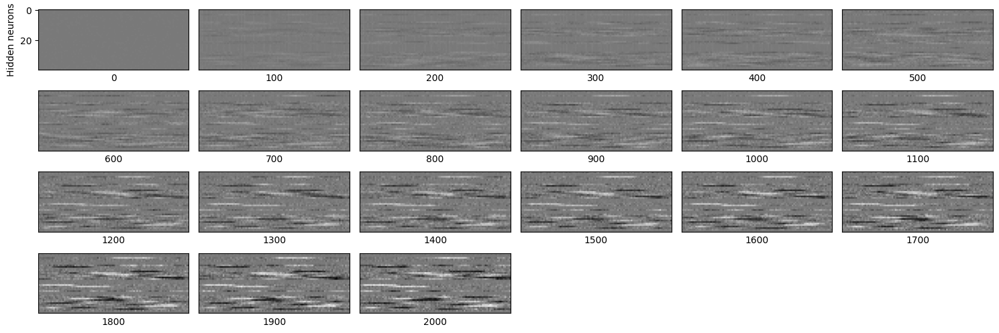

In [4]:
kwargs = dict(
    task='nlgp',
    xi1 = 8,
    xi2 = 2,
    gain = 10, #0.05,
    L = 100,
    dim = 1,
    K = 40,
    batch_size = 1000,
    num_epochs = 10000,
    lr = 1.0,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'ce',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

Already simulated


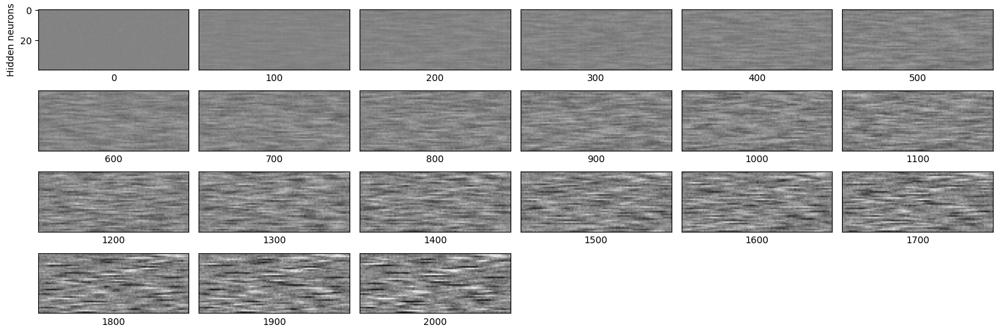

In [6]:
kwargs = dict(
    task='nlgp',
    xi1 = 4,
    xi2 = 2,
    gain = 3, #0.05,
    L = 100,
    dim = 1,
    K = 40,
    batch_size = 1000,
    num_epochs = 10000,
    lr = 0.2,
    init_scale = 1.0,
    save_ = True,
    activation = 'relu',
    loss = 'ce',
    second_layer = 'mean',
)

weights, (losses, accs, iprs) = simulate_or_load(**kwargs)
fig, axs = plot_receptive_fields(weights, num_cols=6, figsize=(15, 5), reordering_fn=None, ind=-1, evaluation_interval=100)
fig.tight_layout()

### USE LR=0.2, IT'S CLEANER!

In [131]:
weights.shape

(101, 100, 400)

Simulating
Arguments:
task: nlgp
xi1: 4
xi2: 2
L: 100
K: 40
gain: 2
dim: 1
batch_size: 1000
num_epochs: 10000
loss: mse
lr: 0.1
activation: tanh
second_layer: learnable_bias
second_scale: 0.01
path: .
save_: True
kwargs: {}
loss_fn: MSELoss
Iteration 500: loss=0.2546, acc=0.4993, IPR>0.05=2.50%
Iteration 1000: loss=0.2512, acc=0.4996, IPR>0.05=2.50%
Iteration 1500: loss=0.2505, acc=0.4997, IPR>0.05=2.50%
Iteration 2000: loss=0.2498, acc=0.5003, IPR>0.05=2.50%
Iteration 2500: loss=0.2489, acc=0.5008, IPR>0.05=2.50%
Iteration 3000: loss=0.2475, acc=0.4998, IPR>0.05=2.50%
Iteration 3500: loss=0.2458, acc=0.5000, IPR>0.05=2.50%
Iteration 4000: loss=0.2434, acc=0.5004, IPR>0.05=2.50%
Iteration 4500: loss=0.2408, acc=0.4994, IPR>0.05=2.50%
Iteration 5000: loss=0.2378, acc=0.5007, IPR>0.05=2.50%
Iteration 5500: loss=0.2348, acc=0.4992, IPR>0.05=2.50%
Iteration 6000: loss=0.2312, acc=0.5002, IPR>0.05=2.50%
Iteration 6500: loss=0.2277, acc=0.4997, IPR>0.05=2.50%
Iteration 7000: loss=0.2238, acc

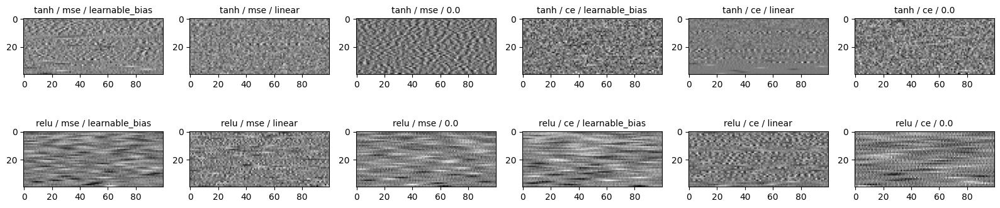

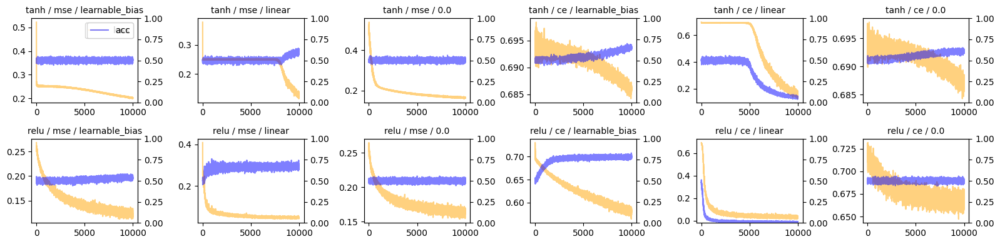

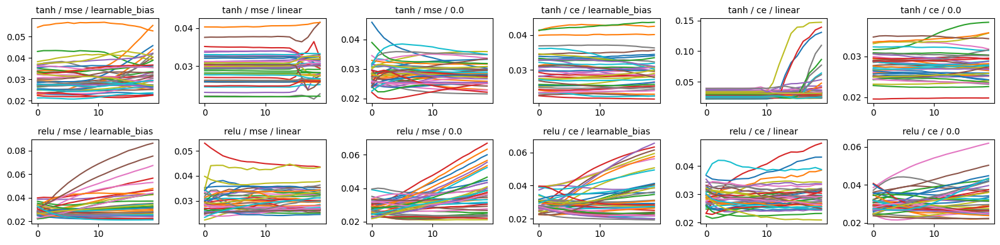

In [11]:
weights, (losses, accs, iprs) = mini_sweep(**kwargs)
figs, axs = viz_mini_sweep(weights, losses, accs, iprs)
for fig in figs: fig.tight_layout()

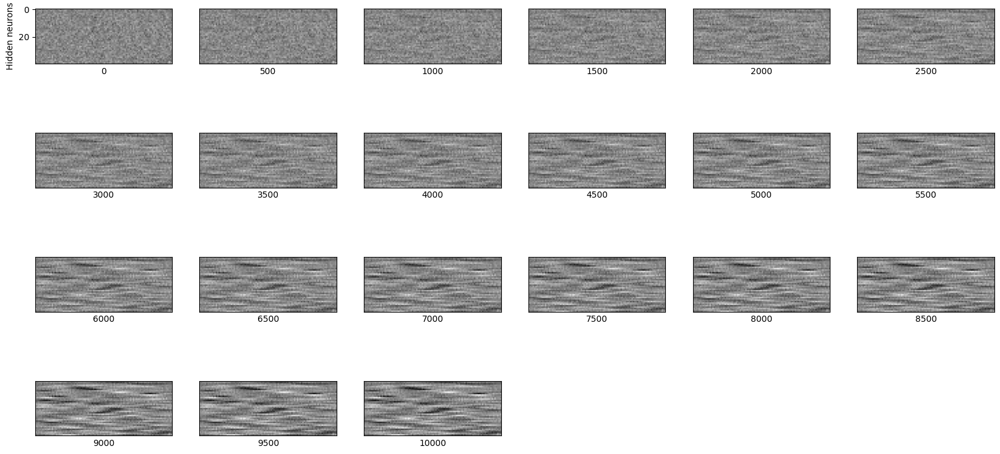

In [27]:
fig, axs = plot_receptive_fields(weights[9], num_cols=6, figsize=(20, 10), reordering_fn=entropy_sort, ind=-1)

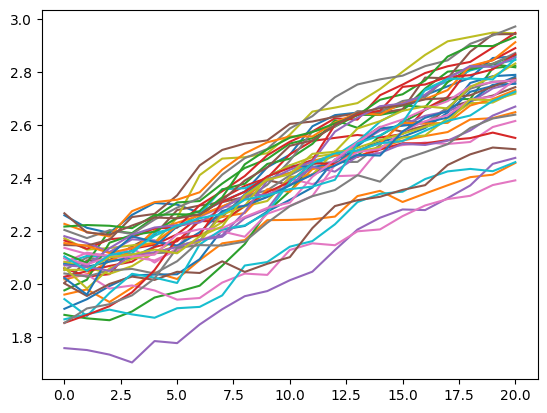

In [30]:
_ = plt.plot(np.stack([entropy(weight) for weight in weights[9]]))

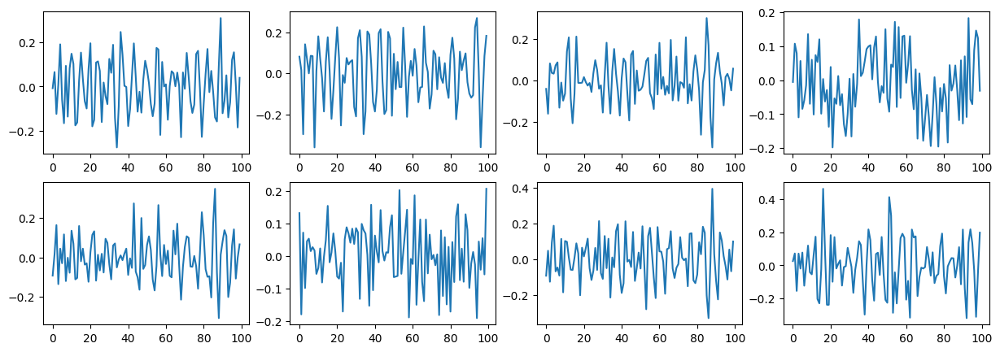

In [32]:
fig, axs = plt.subplots(2, 4, figsize=(15, 5))
for i, ax in enumerate(axs.flatten()):
    ax.plot(weights[0,-1,i,:])

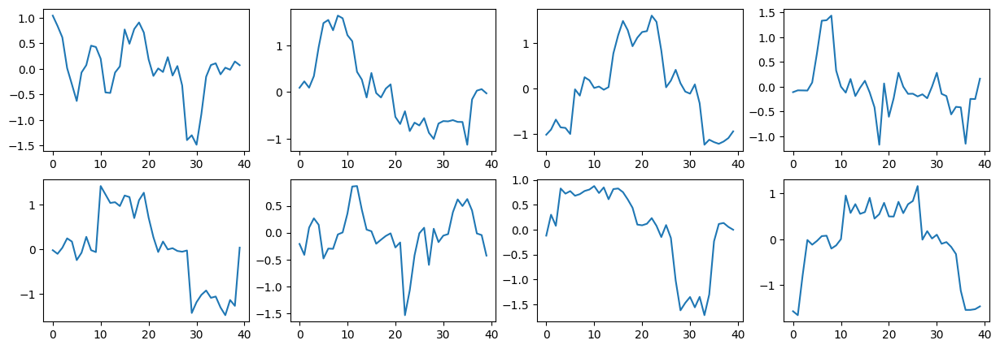

In [19]:
fig, axs = plt.subplots(2, 4, figsize=(15, 5))
for i, ax in enumerate(axs.flatten()):
    ax.plot(weights[-1,i,:])

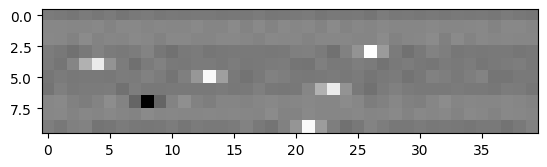

In [28]:
weight_ = weights[-1]
plt.imshow(weight_[:10], cmap='gray')
localized_inds = np.array([3, 4, 5, 6, 7, 9])
oscillatory_inds = np.array([0, 1, 2, 8])

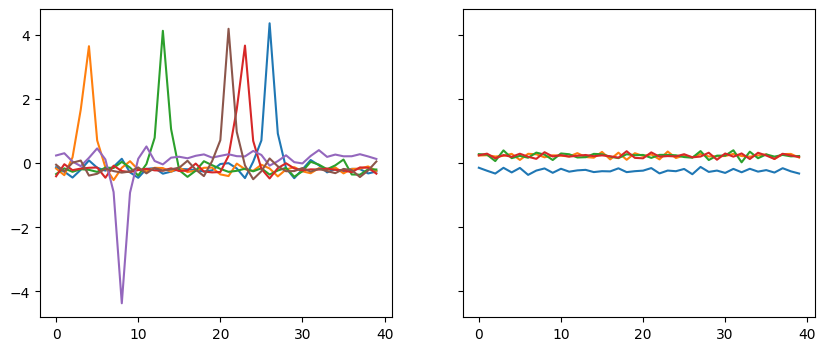

In [29]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
ax1.plot(weight_[localized_inds].T)
ax2.plot(weight_[oscillatory_inds].T)

### With xi1 = [0.1,0.6)

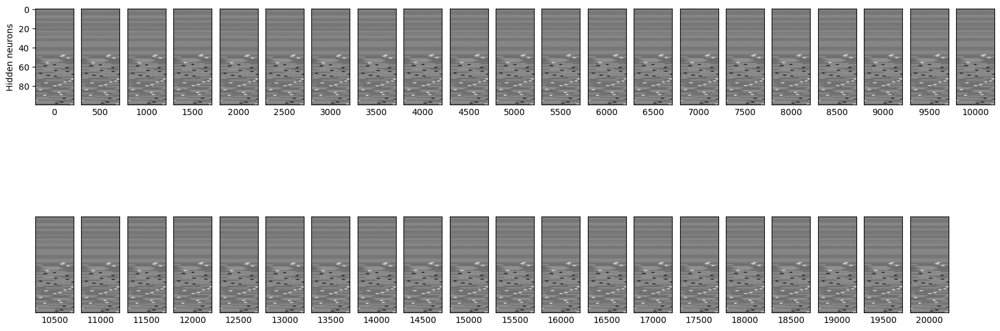

In [10]:
fig, axs = plot_receptive_fields(weights, num_cols=21, evaluation_interval=500, figsize=(20, 8), reordering_fn=entropy_sort, ind=-1)

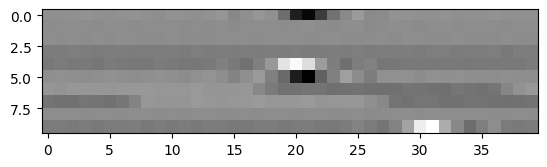

In [16]:
weight_ = weights[-1]
plt.imshow(weight_[:10], cmap='gray')
localized_inds = np.array([0, 4, 5, 9])
oscillatory_inds = np.array([1, 2, 3, 6, 7, 8])

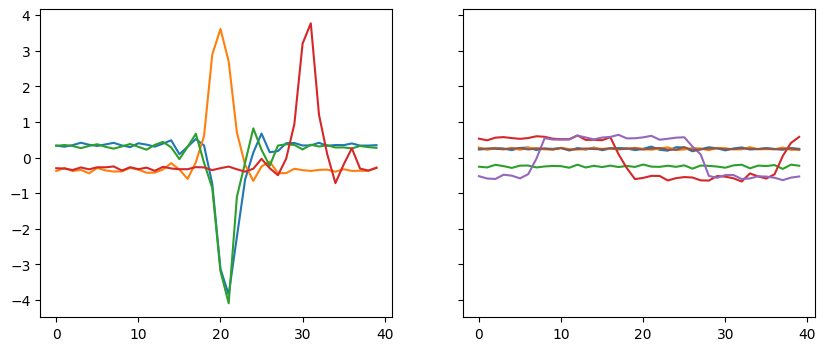

In [19]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
ax1.plot(weight_[localized_inds].T)
ax2.plot(weight_[oscillatory_inds].T)

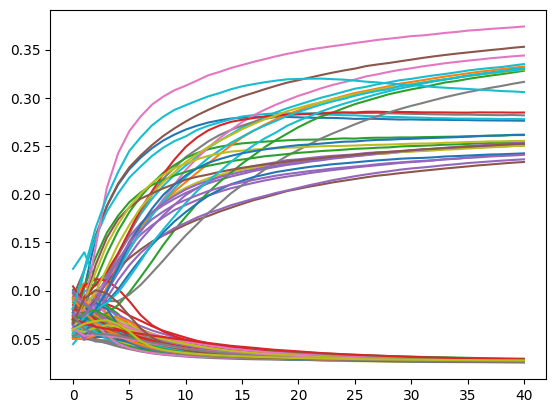

In [22]:
plt.plot(iprs)